<a href="https://colab.research.google.com/github/BenzNgash/Dogbreed_classifier/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.
When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we are using is from Kaggle's dog breed identification competition

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each text image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classes)

* There are around 10000+ images in training set(these images have labels)

* There are around 10000+ images in the test set (these images have no labels, because we'll want to predict them)

In [ ]:
from google.colab import drive
drive.mount( '/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# unzip the uploaded
# !unzip "/content/drive/MyDrive/Untitled folder/dog_vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Untitled folder/dog_vision/"

### Get our Workspace Ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# Import Necessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__ )
print("TF Hub version:", hub.__version__ )

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else  "not available")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU not available


## Getting our data ready (turning into tensors)

With all ML models,our data has to be in numeric format, so that's what we'll be doing first.Turning our images into Tensors(numeric representation)

Let's start by accessing our data and checking out the labels

In [ ]:
# Checkout the labels of our data

import pandas as pd

labels_csv = pd.read_csv("drive/MyDrive/Untitled folder/dog_vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

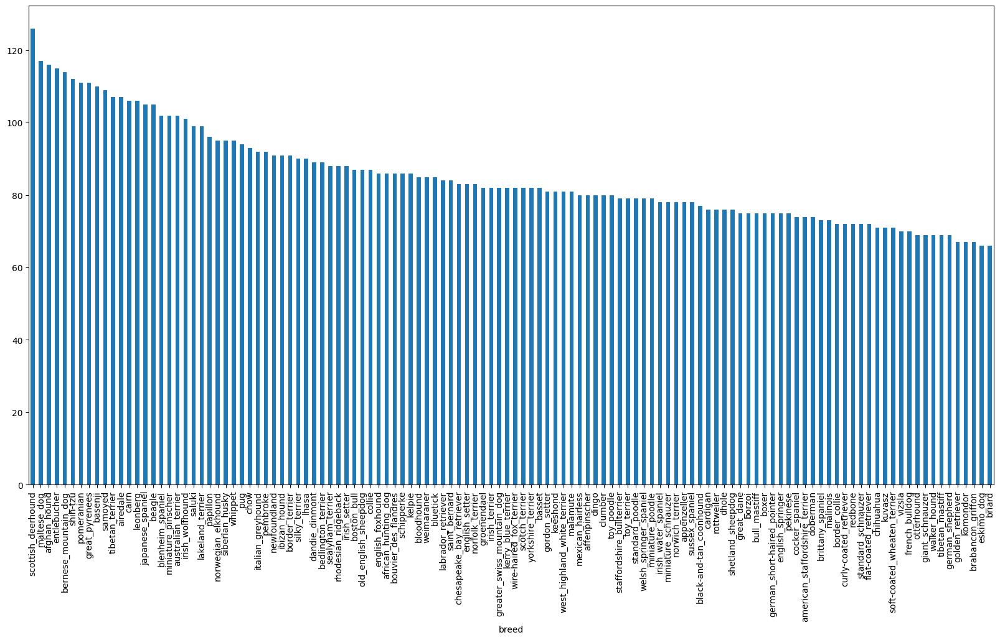

In [ ]:
# How many images are there of each breed?

labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

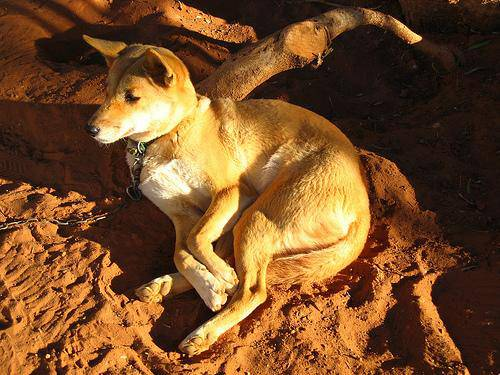

In [ ]:
# Let's view an image

from IPython.display import Image
Image("drive/MyDrive/Untitled folder/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Getting images and their labels

let's get a list of all our image pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = [fname for fname in labels_csv["id"].values]
filenames = ["drive/MyDrive/Untitled folder/dog_vision/train/" + fname + ".jpg" for fname in filenames]

In [ ]:
filenames[:10]

['drive/MyDrive/Untitled folder/dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files

import os
if len(os.listdir("drive/MyDrive/Untitled folder/dog_vision/train/")) == len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames do not match actual amount of files")

Filenames match actual amount of files


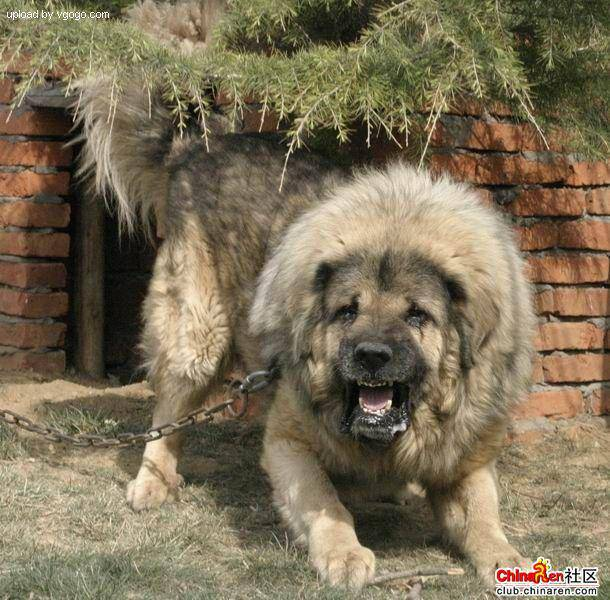

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

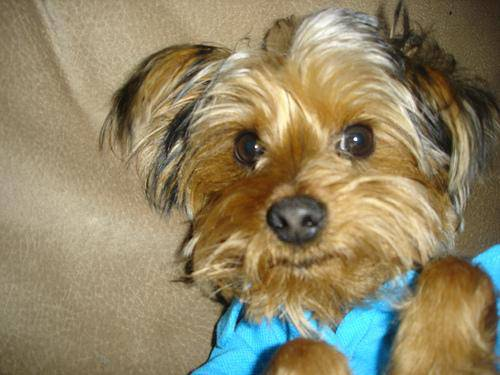

In [ ]:
Image(filenames[3344])

In [ ]:
labels_csv["breed"][3344]

'yorkshire_terrier'

Since we've now got our training image filepaths in alist, let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
    print("Number of labels does not match number of filenames, check data directories")

Number of labels matches number of filenames!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning boolean array into integers

print(labels[0]) # Original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Untitled folder/dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since the dataset from kaggle doesn't come with a validation set
we're going to create our own.

In [ ]:
### setup x & y  variables

X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~ 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a look at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Untitled folder/dog_vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Untitled folder/dog_vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Untitled folder/dog_vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Untitled folder/dog_vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Untitled folder/dog_vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False,

## Preprocessing images (turning images into Tensors)

To preprocess our images into tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, 'image'
3. Turns our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the 'image' to be a shape of (224, 224)
6. Return the modified image

https://www.tensorflow.org/guide/data


Before we do let's see what importing an image looks like

In [ ]:
# Convert image to Numpy Array

from matplotlib.pyplot import imread
image = imread(filenames[88])
image.shape


(500, 375, 3)

array([[[ 40,  36,  33],
        [ 55,  51,  48],
        [ 42,  38,  35],
        ...,
        [246, 246, 255],
        [222, 216, 228],
        [208, 194, 209]],

       [[ 39,  35,  32],
        [ 38,  34,  31],
        [ 40,  36,  33],
        ...,
        [228, 228, 240],
        [216, 210, 224],
        [214, 201, 218]],

       [[ 44,  40,  37],
        [ 29,  25,  22],
        [ 45,  41,  38],
        ...,
        [202, 205, 220],
        [225, 222, 239],
        [215, 206, 225]],

       ...,

       [[ 15,  17,  14],
        [ 15,  17,  14],
        [ 22,  27,  21],
        ...,
        [ 91,  91, 101],
        [119, 119, 129],
        [143, 143, 153]],

       [[  8,  10,   7],
        [ 10,  12,   9],
        [ 21,  26,  20],
        ...,
        [153, 153, 163],
        [130, 130, 140],
        [106, 106, 116]],

       [[  5,   7,   4],
        [  8,  10,   7],
        [ 21,  26,  20],
        ...,
        [126, 126, 136],
        [112, 112, 122],
        [115, 115, 125]]], dtype=uint8)
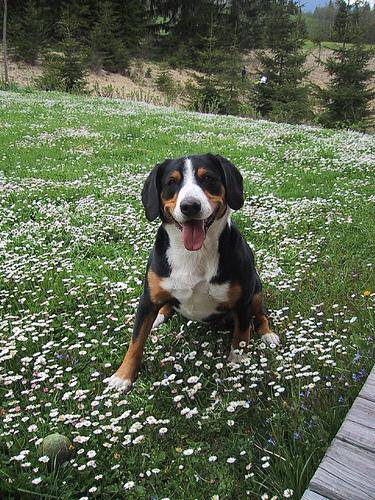

In [ ]:
image

In [ ]:
image[:2]

array([[[ 40,  36,  33],
        [ 55,  51,  48],
        [ 42,  38,  35],
        ...,
        [246, 246, 255],
        [222, 216, 228],
        [208, 194, 209]],

       [[ 39,  35,  32],
        [ 38,  34,  31],
        [ 40,  36,  33],
        ...,
        [228, 228, 240],
        [216, 210, 224],
        [214, 201, 218]]], dtype=uint8)

In [ ]:
# Turn image to a tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 375, 3), dtype=uint8, numpy=
array([[[ 40,  36,  33],
        [ 55,  51,  48],
        [ 42,  38,  35],
        ...,
        [246, 246, 255],
        [222, 216, 228],
        [208, 194, 209]],

       [[ 39,  35,  32],
        [ 38,  34,  31],
        [ 40,  36,  33],
        ...,
        [228, 228, 240],
        [216, 210, 224],
        [214, 201, 218]]], dtype=uint8)>

In [ ]:
labels_csv["breed"][88]

'entlebucher'

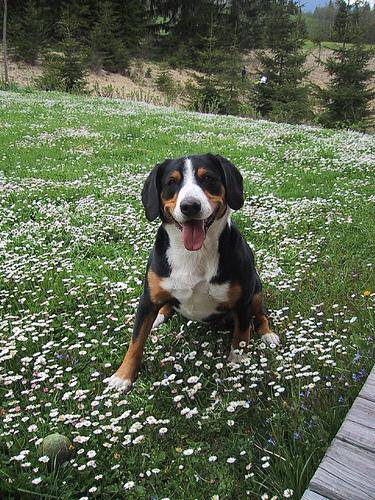

In [ ]:
Image(filenames[88])

Now we've seen what an image looks like as a Tensor, Let's maek a function to preprocess them.

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable, 'image'
3. Turns our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the 'image' to be a shape of (224, 224)
6. Return the modified image

In [ ]:
# Define image size

IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read an image file
  image = tf.io.read_file(image_path)

  # Turn jpeg image into numerical Tensors wuth 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channnel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired size (244, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10000+ images in one go ... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be)

In order to use TensorFlow effectively,we need our data in the form of Tensor tuples which look like this:
`(image, label)`.


In [ ]:
# Create a simple function to return a tuple(image, label)

def get_image_label(image_path, label):
  """
  Takes an image file name and associated label,processes the image
  and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form `(image, label)`, let's make a function to turn all of our data (`x` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepath
                                               tf.constant(y))) # Labels

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepath
                                               tf.constant(y))) # Labels

    # Shuffling pathnames and labels before mapping image processor function is
    # faster than shuffling

    data = data.shuffle(buffer_size=len(X))

    # Create image, label
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch




In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data Batches
Our data is now in batches,however, these can be a little hard to understand/comprehend, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[5.52126884e-01, 5.95264137e-01, 5.28597474e-01],
          [5.45693278e-01, 5.88830531e-01, 5.22163868e-01],
          [5.49228549e-01, 5.92365801e-01, 5.25699139e-01],
          ...,
          [7.01960802e-01, 6.11764729e-01, 4.39215720e-01],
          [6.77240849e-01, 6.11764729e-01, 4.43137288e-01],
          [6.70588255e-01, 6.11764729e-01, 4.43137288e-01]],
 
         [[5.50508440e-01, 5.93645692e-01, 5.26979029e-01],
          [5.45060933e-01, 5.88198185e-01, 5.21531522e-01],
          [5.45413196e-01, 5.88550448e-01, 5.21883786e-01],
          ...,
          [7.01960802e-01, 6.11764729e-01, 4.39215720e-01],
          [6.85679257e-01, 6.12360001e-01, 4.47058856e-01],
          [6.82352960e-01, 6.15686297e-01, 4.47058856e-01]],
 
         [[5.47364056e-01, 5.90501308e-01, 5.23834646e-01],
          [5.41363835e-01, 5.84501088e-01, 5.17834425e-01],
          [5.42725861e-01, 5.85863113e-01, 5.19196451e-01],
          ...,
          [7.01960802e-01, 6.11764729e-01, 4.4459

In [ ]:
len(train_images), len(train_labels)

(32, 32)

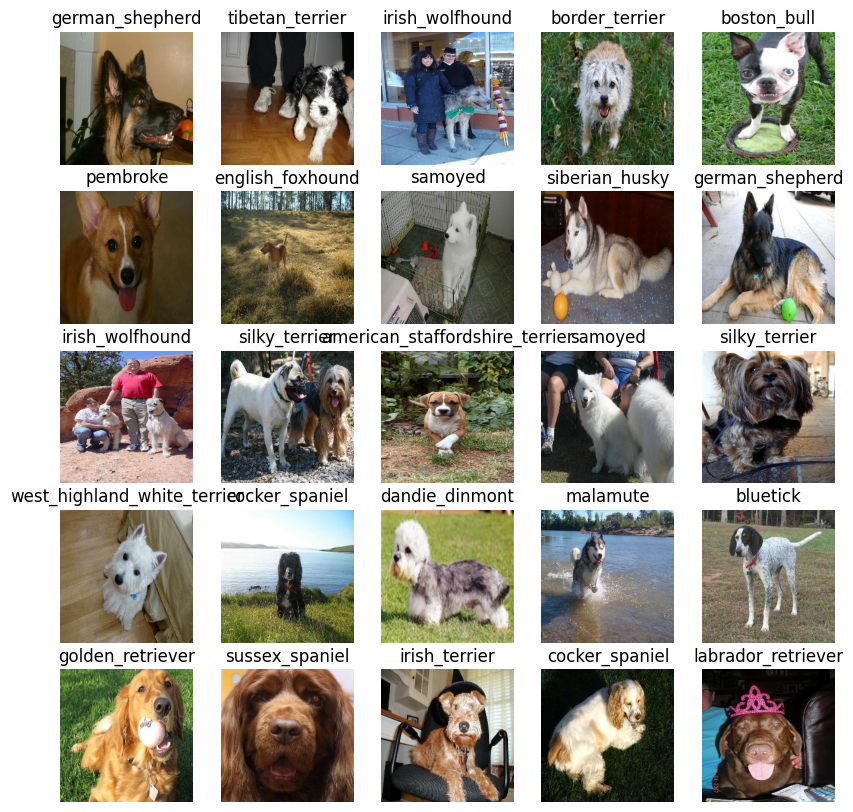

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

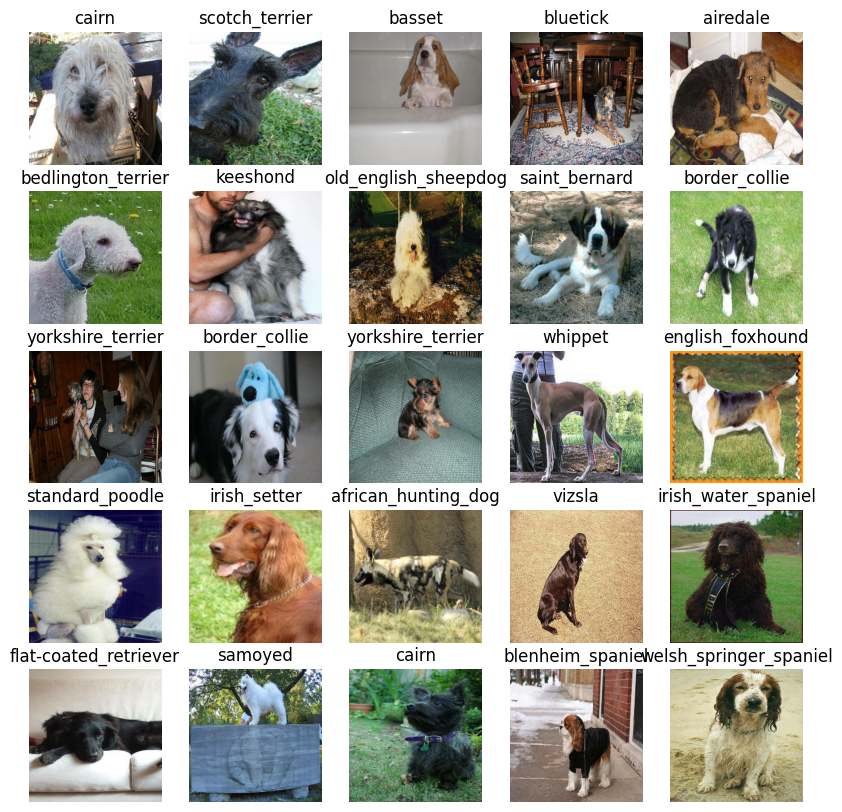

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few thins we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlowHub - "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [ ]:
IMG_SIZE

224

Now we've got our inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model:

Knowing this, let's create a function which:
* Take the input shape and the model
 we've chosen as parameters
* Define the layers in a Keras model in a sequential fashion (do this first, then this, then that).
* Compile the model (says it should be evaluated and improved)
* Build the model (tells the model the input shape it'll be getting)
* Returns the model

All of these steps can be found here:https://www.tensorflow.org/guide/keras

In [ ]:
# Setup input shape of the model

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, Height, Width, Colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

In [ ]:
# Create a function which nuilds a Keras Model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
!pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check progress or stop training early is a model stops improving

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

#### TensorBoard Callback

To setup TensorBoard callback,we need to do 3 things:
1. Load the tensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with `%tensorboard` magic function (we'll  do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard Logs
  logdir = os.path.join("/content/drive/MyDrive/Untitled folder/dog_vision/logs",
                        # Make it so the los get tracked whenever we run the experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  print(f"Saving TensorBoard log files to: {logdir}")

  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.




In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100}

In [ ]:
# Check to make sure we're still running on a GPU

print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU not available :(


In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data,validation data,number of epochs to train for `(NUM_EPOCHS)` and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train the model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  return model

In [ ]:
# Fit the model to the data
#model = train_model()

**Question:** It looks like our model is overfitting because it's performing far better on the trainig data than it is on the validation data. What are some ways to prevent model overfitting i deep learning neural networks?

**Note:** Ovefitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function `(%tensorboard)` will access the logs directory we created earlier and visualize its content

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Untitled\ folder/dog_vision/logs

<IPython.core.display.Javascript object>

# Making an evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Mae predictions on the validation data (not used to train on)

predictions = model.predict(val_data, verbose=1) # Set verbosity to see how long it takes
predictions

7/7 [==============================] - 118s 19s/step


array([[0.00097216, 0.0002859 , 0.00158664, ..., 0.00190479, 0.00751994,
        0.01066588],
       [0.00513968, 0.00063422, 0.01594593, ..., 0.00349283, 0.00464656,
        0.01849154],
       [0.00152738, 0.00072947, 0.00030828, ..., 0.00112399, 0.03663046,
        0.00661204],
       ...,
       [0.00297501, 0.00060184, 0.00166363, ..., 0.01630675, 0.00413571,
        0.00282484],
       [0.00545009, 0.0068068 , 0.04178565, ..., 0.00412561, 0.02693373,
        0.00042427],
       [0.00436688, 0.00105291, 0.00943594, ..., 0.01557429, 0.000496  ,
        0.00070131]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
predictions[0]

array([9.72163980e-04, 2.85900343e-04, 1.58663746e-03, 2.23557372e-03,
       2.39531393e-03, 4.53520231e-02, 3.80939542e-04, 2.35393643e-03,
       2.46950123e-03, 7.66302552e-03, 2.02514175e-02, 1.29694154e-03,
       3.54684866e-03, 1.35195572e-02, 8.46768450e-03, 4.18109790e-04,
       1.95339248e-02, 1.27921265e-03, 1.17740000e-03, 3.77681019e-04,
       1.67556899e-03, 2.61791050e-03, 3.67854349e-03, 8.34688637e-03,
       8.21525604e-03, 3.37515771e-03, 2.41632741e-02, 8.91552307e-03,
       3.46838310e-03, 3.80041637e-02, 9.09786019e-03, 5.39105292e-03,
       1.26260426e-02, 5.67717012e-04, 3.06524686e-03, 7.75580294e-04,
       8.43371090e-05, 9.48923081e-03, 3.28935636e-03, 1.34222093e-04,
       1.79340388e-03, 1.84042789e-02, 4.91977762e-03, 5.54479659e-04,
       8.83508590e-04, 1.18551040e-02, 6.29996503e-05, 5.87599073e-03,
       4.43821261e-03, 8.64044297e-03, 2.35216389e-03, 5.33791119e-03,
       6.90687960e-03, 8.59918538e-03, 2.72695976e-03, 2.00245320e-03,
      

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")



[0.00138826 0.00012019 0.00233347 0.01131441 0.00518298 0.00091245
 0.00130827 0.00118877 0.0169749  0.00704469 0.00311312 0.00942594
 0.00258819 0.00576922 0.0029702  0.0234013  0.00177519 0.00109825
 0.00401048 0.01219336 0.00332533 0.00811003 0.0075009  0.0237785
 0.00072031 0.00492237 0.01097999 0.01184353 0.00111033 0.00132953
 0.00207519 0.00506066 0.09373423 0.01267807 0.00079169 0.0074488
 0.00171126 0.00460201 0.00801705 0.02622478 0.00076559 0.00089327
 0.00172576 0.0019527  0.00652378 0.00483994 0.01027162 0.00053501
 0.01882484 0.00992509 0.00456847 0.00560864 0.00898839 0.00055388
 0.00952559 0.00741879 0.00109175 0.00163499 0.01182922 0.00608133
 0.02451906 0.01182049 0.00106225 0.00242344 0.002295   0.00440485
 0.00720511 0.02909652 0.04984412 0.00628843 0.00022548 0.00750455
 0.02802878 0.0043345  0.00848392 0.01395385 0.00240011 0.00118878
 0.00283258 0.00290953 0.00551981 0.00088136 0.00151842 0.00647078
 0.00073006 0.00254756 0.0052367  0.00627012 0.00143612 0.000512

In [ ]:
unique_breeds[113]

'walker_hound'

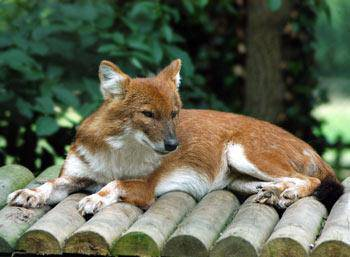

In [ ]:
Image(filenames[index])

Having the above functionality is great but we want to be able to do it at scale

And it would be even better if we could see the image the prediction is being made on:

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities intotheir respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'shih-tzu'

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make predictions on the validation data

In [ ]:
images_ = []
labels_ = []

# loopthrough unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'malamute'

In [ ]:
# Lets use a  function instead

def unbatchfy(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels.
  """
  images_ = []
  labels_ = []

  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_


# Unbatchfy the validation data
val_images, val_labels = unbatchfy(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make this a bit more visual

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.

* Convert the prediction probabilities to a predicted label.

* Plot the predicted label, its predicted probability, the truth label and the target image on a singl plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth labels
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  plt.show()

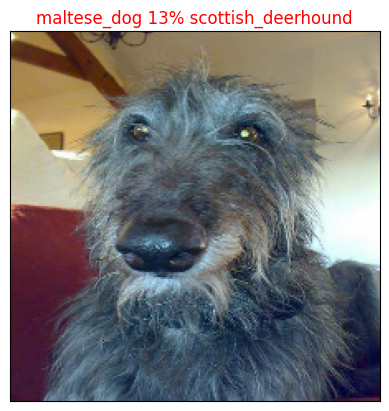

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=25

          )

Now we've got one function to visualize our models top predictions, let's make another to view our model top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels

* Plot the top 10 prediction probabilities values and labels,coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.11113071, 0.08474372, 0.04535202, 0.03913992, 0.03800416,
       0.03102081, 0.02569377, 0.02416327, 0.02025142, 0.01976587],
      dtype=float32)

In [ ]:
predictions[0].max()

0.111130714

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['malamute', 'mexican_hairless', 'appenzeller', 'miniature_poodle',
       'chihuahua', 'kuvasz', 'rottweiler', 'cairn', 'bedlington_terrier',
       'schipperke'], dtype=object)

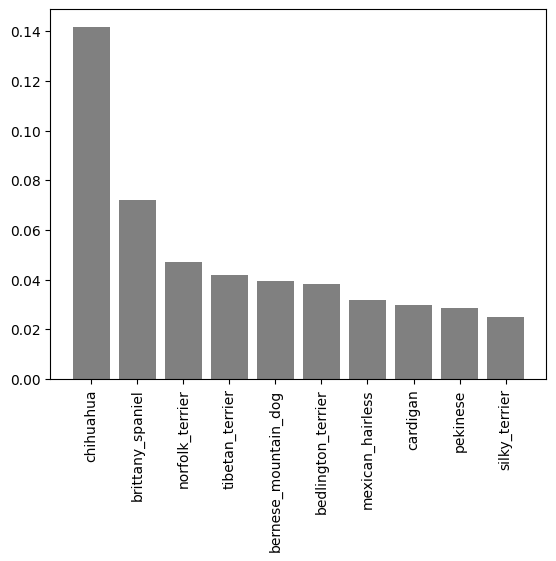

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=45)

Now we've got some function to help us visualize our predictions and evaluate our module, let's check out

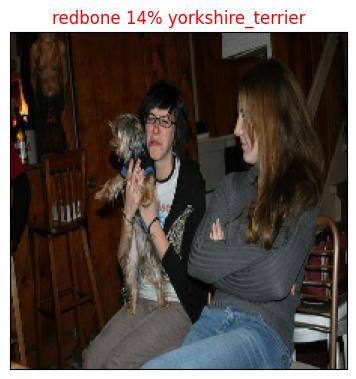

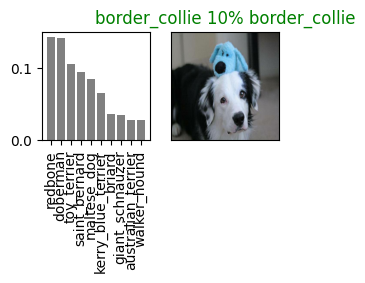

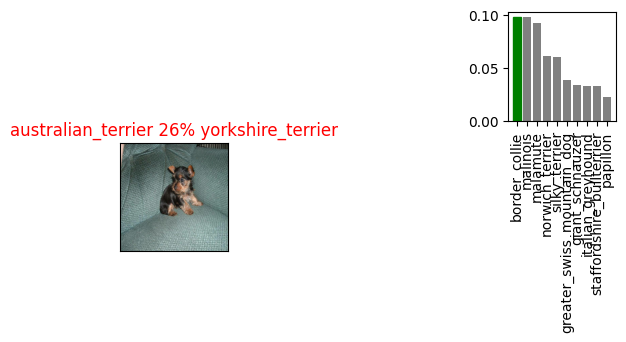

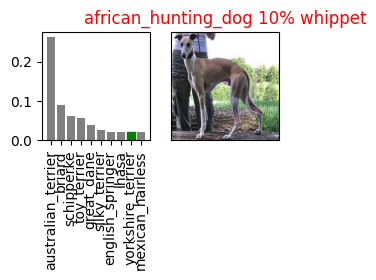

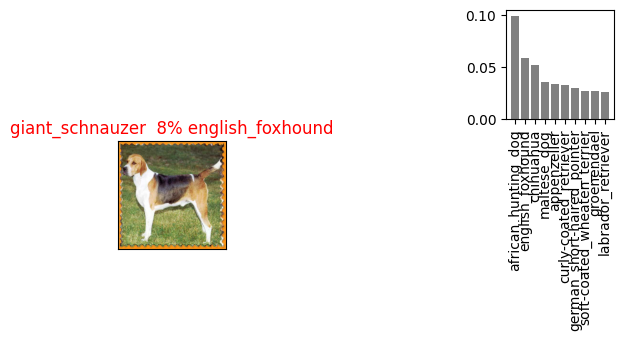

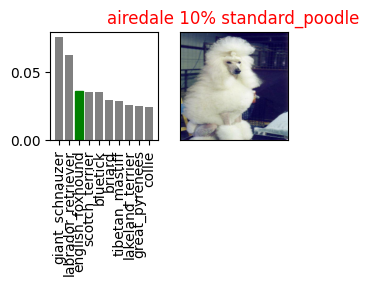

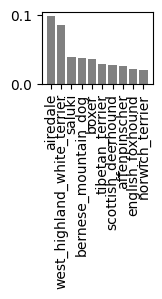

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our model predictions and true labels?


# Saving and reloading a trained a model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Untitled folder/dog_vision/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load trained model,Let's make sure it works!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Untitled folder/dog_vision/Models/20250307-07111741331483-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Untitled folder/dog_vision/Models/20250307-07111741331483-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Untitled folder/dog_vision/Models/20250307-06411741329672-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Untitled folder/dog_vision/Models/20250307-06411741329672-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 5.7776 - accuracy: 0.0200


[5.777578353881836, 0.019999999552965164]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 1.2052 - accuracy: 0.6850


[1.2052114009857178, 0.6850000023841858]

## Training a big dog model(on the fulldata)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Untitled folder/dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Untitled folder/dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data, so we can monitor val accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)


Saving TensorBoard log files to: /content/drive/MyDrive/Untitled folder/dog_vision/logs/20250307-071155


**Note:** Running the cell below will take a little while (maybe 30 min for the first epoch) because the GPU we're using the runtime has loaded all the images into memory.

In [ ]:
# Fit the full model to the full data

full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 623s 2s/step - loss: 1.3354 - accuracy: 0.6708
Epoch 2/100
320/320 [==============================] - 612s 2s/step - loss: 0.4043 - accuracy: 0.8792
Epoch 3/100
320/320 [==============================] - 609s 2s/step - loss: 0.2355 - accuracy: 0.9352
Epoch 4/100
320/320 [==============================] - 603s 2s/step - loss: 0.1543 - accuracy: 0.9642
Epoch 5/100
320/320 [==============================] - 606s 2s/step - loss: 0.1073 - accuracy: 0.9769
Epoch 6/100
320/320 [==============================] - 605s 2s/step - loss: 0.0784 - accuracy: 0.9858
Epoch 7/100
320/320 [==============================] - 603s 2s/step - loss: 0.0593 - accuracy: 0.9910
Epoch 8/100
320/320 [==============================] - 608s 2s/step - loss: 0.0462 - accuracy: 0.9932
Epoch 9/100
320/320 [==============================] - 600s 2s/step - loss: 0.0375 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 597s 2s/step - loss: 0.030

In [ ]:
save_model(full_model, suffix="full-images-mobilenetv2-Adam")